In [1]:

import warnings
import numpy as np
# import pandas as pd
import scanpy as sc
import scipy
from featuremap import featuremap_

sc.logging.print_header()
sc.settings.set_figure_params(dpi=120, facecolor='white')

warnings.simplefilter("ignore", category=UserWarning)
warnings.simplefilter("ignore", category=FutureWarning)

/Users/uqyyao4/opt/anaconda3/envs/featmap/lib/python3.9/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


scanpy==1.9.8 anndata==0.10.5.post1 umap==0.5.4 numpy==1.23.5 scipy==1.12.0 pandas==2.2.1 scikit-learn==1.2.2 statsmodels==0.14.0 igraph==0.11.4 louvain==0.8.0 pynndescent==0.5.11


# FeatureMAP on exhausted CD8+ T cells
1. GEX and GVA visualization
2. Gene variation trajectory and pseudotime
3. Core and transition states, leiden clustering implementation
4. DGV to indentify important genes
5. Gene contribution visualization


## Data loading


In [2]:

# # Datasets
# _datasets = {
#     "pancreas": ("https://figshare.com/ndownloader/files/25060877", (2531, 27998)),
#     "pancreas_preprocessed": ("https://figshare.com/ndownloader/files/25030028", (2531, 2000)),
#     "pancreas_preprocessed_vk": ("https://figshare.com/ndownloader/files/41325411", (2531, 5974)),
#     "lung": ("https://figshare.com/ndownloader/files/25038224", (24882, 24051)),
#     "reprogramming_morris": ("https://figshare.com/ndownloader/files/25503773", (104679, 22630)),
#     "zebrafish": ("https://figshare.com/ndownloader/files/27265280", (2434, 23974)),
#     "reprogramming_schiebinger": ("https://figshare.com/ndownloader/files/28618734", (236285, 19089)),
#     "reprogramming_schiebinger_serum_subset": ("https://figshare.com/ndownloader/files/35858033", (165892, 19089)),
#     "bone_marrow": ("https://figshare.com/ndownloader/files/35826944", (5780, 27876)),
# }

# import os
# dataset = 'lung'
# filepath = f'datasets/{dataset}.h5ad'
# # Check if the data is already downloaded
# if not os.path.exists(filepath):
#     print(f'Downloading {dataset} dataset...')
#     # Download the preprocessed pancreas dataset
#     adata = sc.read(filename=filepath, backup_url=_datasets[dataset][0])
# else:
#     adata = sc.read(filepath)

# # import scvelo as scv
# # scv.pp.filter_and_normalize(adata, min_shared_counts=20, n_top_genes=2000 )
    
# # Preprocessing
# sc.pp.filter_cells(adata, min_genes=100)
# sc.pp.filter_genes(adata, min_cells=3)
# # Normalizing to median total counts
# sc.pp.normalize_total(adata)
# # Logarithmize the data
# sc.pp.log1p(adata)
# # Highly variable genes
# sc.pp.highly_variable_genes(adata, n_top_genes=2000)
# adata = adata[:, adata.var.highly_variable]

adata = sc.read('/Users/uqyyao4/Library/CloudStorage/OneDrive-TheUniversityofQueensland/project/FeatureMAP_rev/data/CD8_exhaustion/CD8_exhaustion_cl13.h5ad')



## FeatureMAP GEX and GVA visualization

UMAP embedding.

Performing SVD decomposition on the data
SVD decomposition time is 142.78018522262573


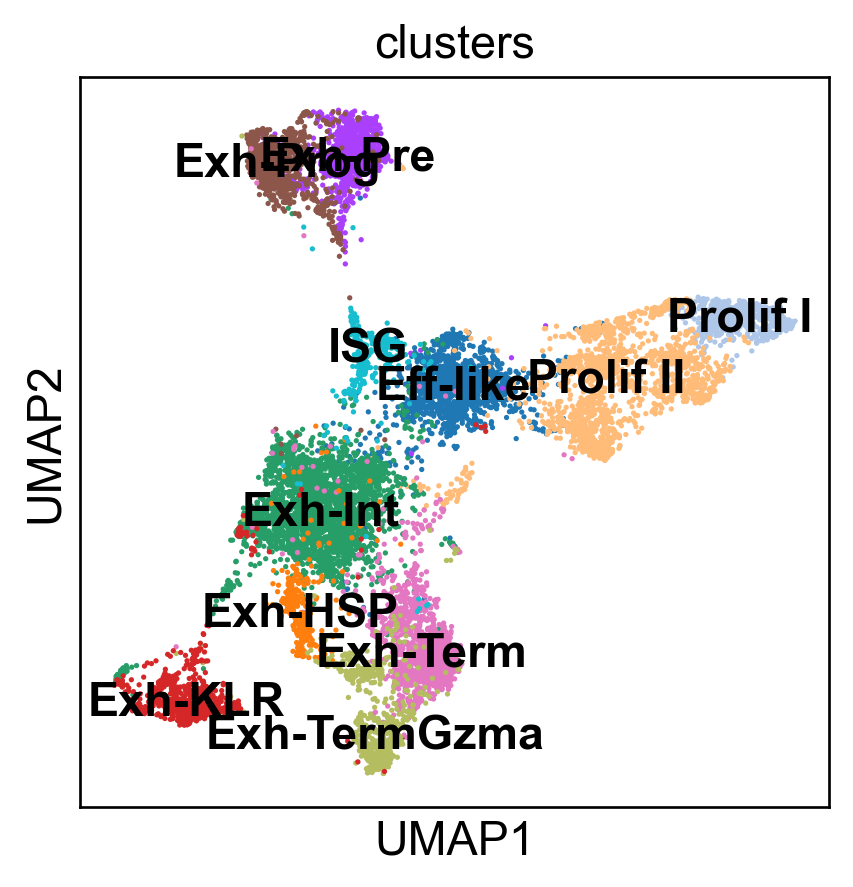

In [3]:
import umap

data = adata.X.copy()
emb_svd, vh = featuremap_._preprocess_data(data)

adata.obsm['X_svd'] = emb_svd

emb_umap = umap.UMAP(n_neighbors=30, random_state=42).fit_transform(emb_svd)
adata.obsm['X_umap'] = emb_umap
sc.pl.embedding(adata, basis='umap', color='clusters', legend_loc='on data')

### GEX embedding

In [4]:
 
import importlib
importlib.reload(featuremap_)


emb_featuremap = featuremap_.FeatureMAP(
                    random_state=42,
                    output_variation=False,
                    output_feat=True,
                    verbose=True,
                    ).fit(emb_svd)

FeatureMAP(output_feat=True, random_state=42, verbose=True)
Tue Jun 11 15:52:35 2024 Construct fuzzy simplicial set
Tue Jun 11 15:52:35 2024 Finding Nearest Neighbors
Tue Jun 11 15:52:35 2024 Building RP forest with 10 trees
Tue Jun 11 15:52:35 2024 NN descent for 14 iterations
	 1  /  14
	 2  /  14
	 3  /  14
	 4  /  14
	Stopping threshold met -- exiting after 4 iterations
Tue Jun 11 15:52:36 2024 Finished Nearest Neighbor Search
Tue Jun 11 15:52:37 2024 Construct embedding
Tue Jun 11 15:52:37 2024 Computing tangent space
Tue Jun 11 15:52:51 2024 Local SVD time is 13.446706056594849
Tue Jun 11 15:52:56 2024 Computing diameter time is 4.853332996368408
Tue Jun 11 15:52:56 2024 Average over 12 times
Tue Jun 11 15:53:10 2024 Average time is 14.338715076446533
Tue Jun 11 15:53:11 2024 Tangent_space_approximation time is 33.39028596878052
Tue Jun 11 15:53:11 2024 Tangent space embedding
Tue Jun 11 15:53:31 2024 Tangent_space_embedding time is 19.94855809211731


/Users/uqyyao4/opt/anaconda3/envs/featmap/lib/python3.9/site-packages/numba/core/decorators.py:250: RuntimeWarning: nopython is set for njit and is ignored
  warnings.warn('nopython is set for njit and is ignored', RuntimeWarning)


Tue Jun 11 15:53:31 2024 Start optimizing layout


Epochs completed: 100%| ██████████ 400/400 [01:21]


Tue Jun 11 15:54:52 2024 Optimize layout time is 81.30007886886597
Tue Jun 11 15:54:52 2024 Computing expression embedding densities
Tue Jun 11 15:54:57 2024 Embedding radii computation time is 4.226367950439453
Tue Jun 11 15:54:57 2024 Finished embedding


/Users/uqyyao4/Library/CloudStorage/OneDrive-TheUniversityofQueensland/project/FeatureMAP-1/featuremap/featuremap_.py:912: RuntimeWarning: invalid value encountered in sqrt
  featuremap_kwds["re_sum"] = np.sqrt(re_sum) # Variance of Gaussian distribution


mu is not added to adata


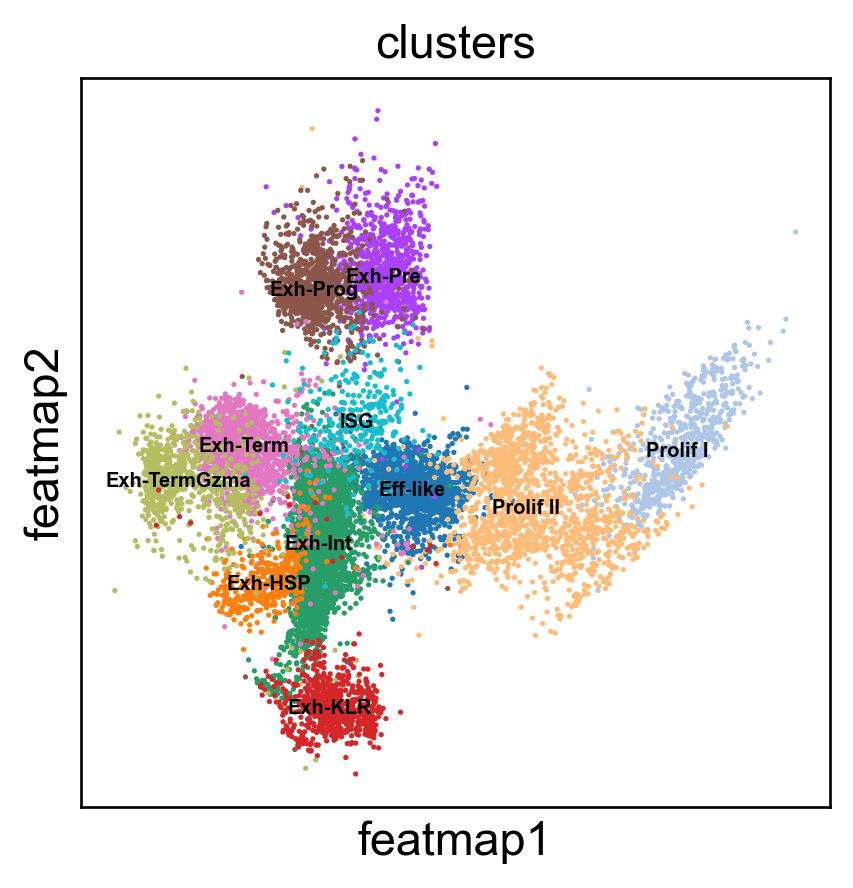

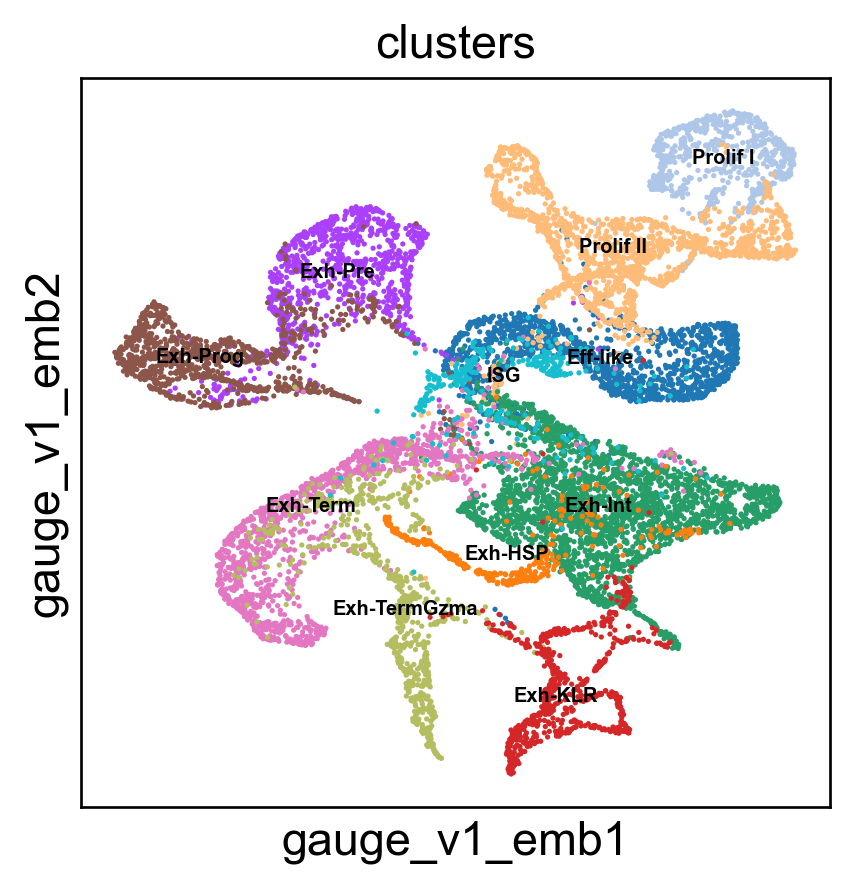

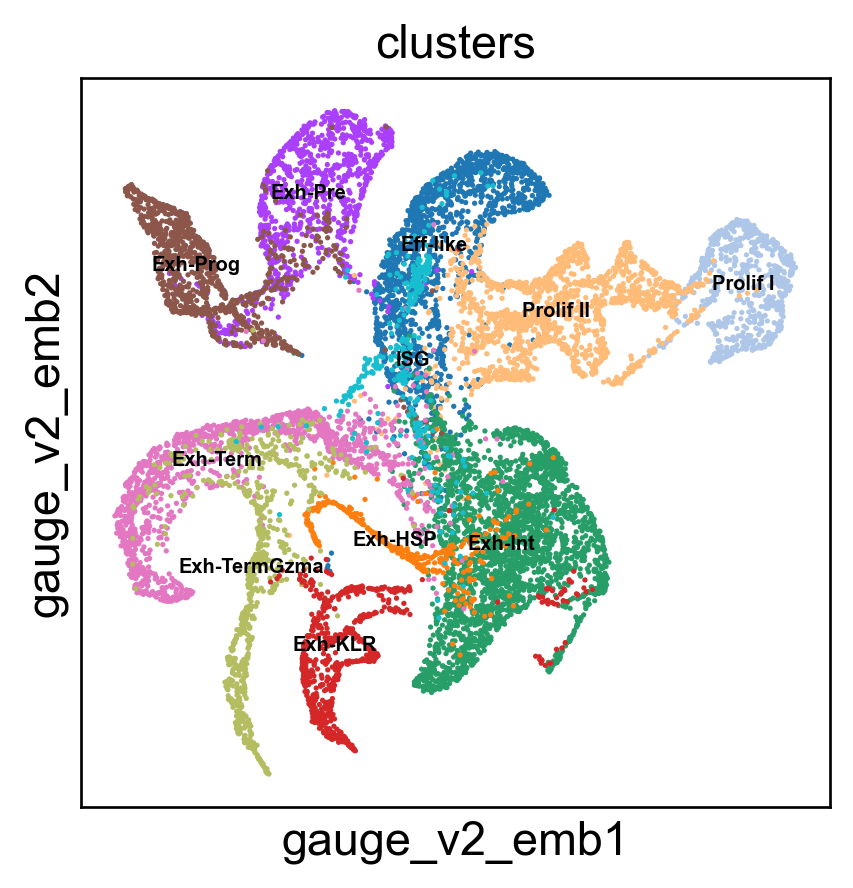

In [6]:
# create adata object
from featuremap import features
import importlib
importlib.reload(features)

adata = features.create_adata(X=adata.X, emb_featuremap=emb_featuremap, obs=adata.obs, var=adata.var)
adata.obsm['X_svd'] = emb_svd
adata.varm['svd_vh'] = vh.T
# adata.obsm['X_featmap'] = emb_featuremap.embedding_
# adata.obsm['gauge_v1_emb'] = emb_featuremap._featuremap_kwds['gauge_v1_emb']
# adata.obsm['gauge_v2_emb'] = emb_featuremap._featuremap_kwds['gauge_v2_emb']
# adata.obsm['vh_smoothed'] = emb_featuremap._featuremap_kwds['vh_smoothed']
# adata.obsm['Singular_value'] = emb_featuremap._featuremap_kwds['Singular_value']
# adata.varm['svd_vh'] = emb_featuremap._featuremap_kwds['svd_vh'].T
# adata.obsm['VH_embedding'] = emb_featuremap._featuremap_kwds['VH_embedding']

sc.pl.embedding(adata, 'featmap',legend_fontsize=6, s=10, legend_loc='on data', color=['clusters'])
sc.pl.embedding(adata, 'gauge_v1_emb',legend_fontsize =6, s=10,legend_loc='on data', color=['clusters'])
sc.pl.embedding(adata, 'gauge_v2_emb',legend_fontsize =6,s=10, legend_loc='on data', color=['clusters'])


### GVA embedding

In [7]:
# Variation embedding
import importlib
importlib.reload(featuremap_)

<module 'featuremap.featuremap_' from '/Users/uqyyao4/Library/CloudStorage/OneDrive-TheUniversityofQueensland/project/FeatureMAP-1/featuremap/featuremap_.py'>

FeatureMAP(min_dist=0.3, output_variation=True, random_state=42, verbose=True)
Tue Jun 11 16:53:15 2024 Construct fuzzy simplicial set
Tue Jun 11 16:53:15 2024 Finding Nearest Neighbors
Tue Jun 11 16:53:15 2024 Building RP forest with 10 trees
Tue Jun 11 16:53:15 2024 NN descent for 14 iterations
	 1  /  14
	 2  /  14
	 3  /  14
	 4  /  14
	Stopping threshold met -- exiting after 4 iterations
Tue Jun 11 16:53:16 2024 Finished Nearest Neighbor Search
Tue Jun 11 16:53:16 2024 Construct embedding
Tue Jun 11 16:53:16 2024 Computing tangent space
Tue Jun 11 16:53:27 2024 Local SVD time is 10.355044841766357
Tue Jun 11 16:53:32 2024 Computing diameter time is 4.693572044372559
Tue Jun 11 16:53:32 2024 Average over 12 times
Tue Jun 11 16:53:46 2024 Average time is 14.0011887550354
Tue Jun 11 16:53:46 2024 Tangent_space_approximation time is 29.571189165115356
k is 13
Tue Jun 11 16:53:57 2024 Variation_embedding time is 11.037138938903809
Tue Jun 11 16:53:57 2024 Finished embedding


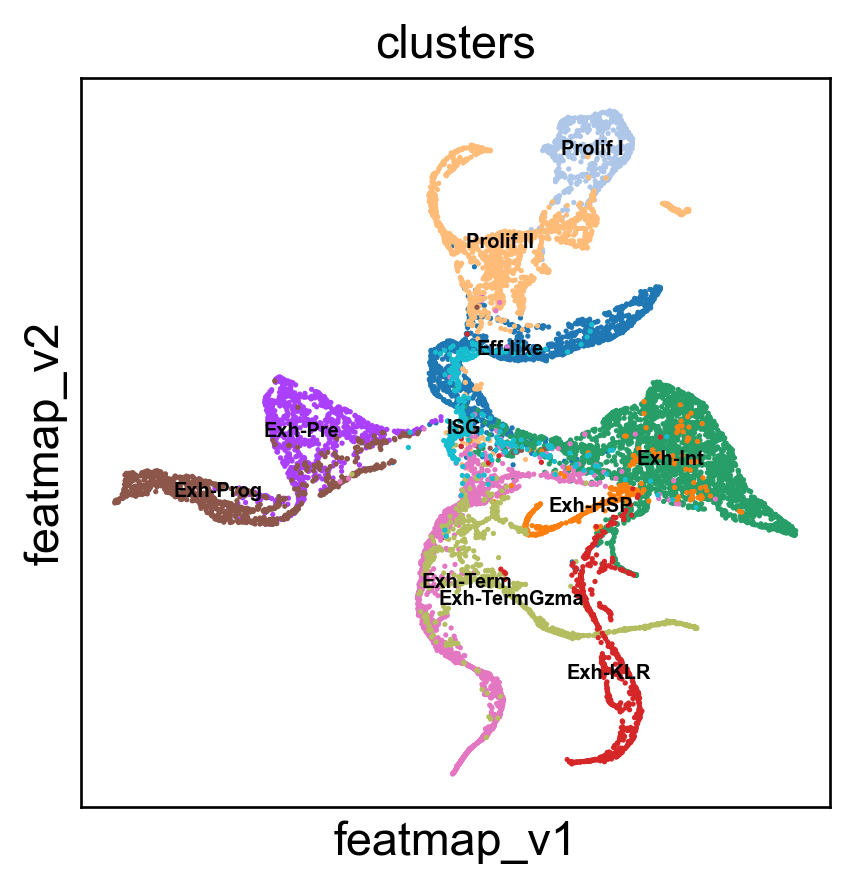

In [41]:

emb_featuremap = featuremap_.FeatureMAP(random_state=42,output_variation=True,threshold=0.9, min_dist=0.3, verbose=True).fit(emb_svd)

adata.obsm['X_featmap_v'] = emb_featuremap.embedding_
sc.pl.embedding(adata, 'featmap_v',legend_fontsize=6, s=10, legend_loc='on data', color=['clusters'])

adata.obsm['variation_pc'] = emb_featuremap._featuremap_kwds['variation_pc']


3D embedding

In [9]:
data = adata.X.copy()
from featuremap import featuremap_
emb_featuremap_3d = featuremap_.FeatureMAP(n_components=3,random_state=42,output_variation=True, verbose=True).fit_transform(emb_svd)

adata.obsm['X_featmap_v_3d'] = emb_featuremap_3d


FeatureMAP(n_components=3, output_variation=True, random_state=42, verbose=True)
Tue Jun 11 15:57:09 2024 Construct fuzzy simplicial set
Tue Jun 11 15:57:09 2024 Finding Nearest Neighbors
Tue Jun 11 15:57:09 2024 Building RP forest with 10 trees
Tue Jun 11 15:57:09 2024 NN descent for 14 iterations
	 1  /  14
	 2  /  14
	 3  /  14
	 4  /  14
	Stopping threshold met -- exiting after 4 iterations
Tue Jun 11 15:57:10 2024 Finished Nearest Neighbor Search
Tue Jun 11 15:57:10 2024 Construct embedding
Tue Jun 11 15:57:10 2024 Computing tangent space
Tue Jun 11 15:57:21 2024 Local SVD time is 10.567543983459473
Tue Jun 11 15:57:26 2024 Computing diameter time is 4.701480865478516
Tue Jun 11 15:57:26 2024 Average over 12 times
Tue Jun 11 15:57:40 2024 Average time is 14.44635009765625
Tue Jun 11 15:57:41 2024 Tangent_space_approximation time is 30.419630765914917
k is 13
Tue Jun 11 15:57:52 2024 Variation_embedding time is 11.601794958114624
Tue Jun 11 15:57:52 2024 Finished embedding


In [10]:



from featuremap import features
import importlib
importlib.reload(features)

features.featuremap_var_3d(emb_featuremap_3d, color=adata.obs['clusters'])

Pseudotime.

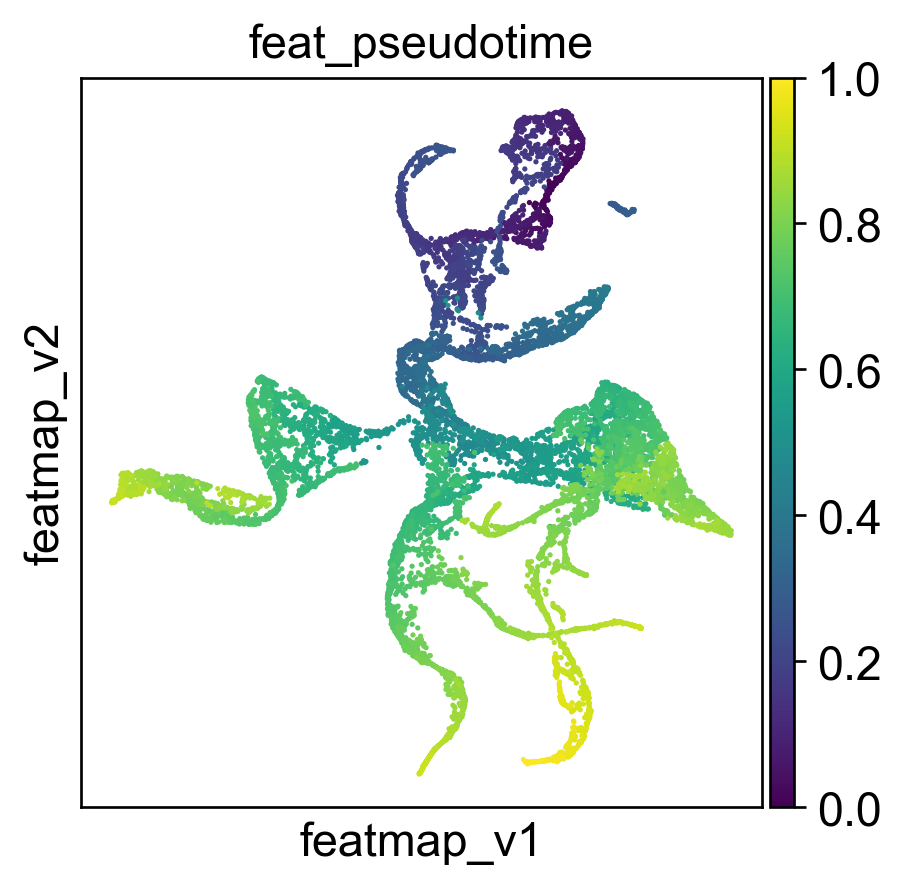

In [30]:
# FeatureMAP pseudo-time
from featuremap import features
import importlib
importlib.reload(features)

# Starting point index
# Randomly select a starting point from cluster "Ng3 low EP"
start_point_index = np.where(adata.obs['clusters'] == 'Prolif I')[0][0]
features.pseudotime_mst(adata, random_state=42, start_point_index=start_point_index)

sc.pl.embedding(adata, 'featmap_v',legend_fontsize=10, s=10, color=['feat_pseudotime'])

In [31]:
features.featuremap_var_3d(emb_featuremap_3d, color=adata.obs['feat_pseudotime'])

## Core and transition states

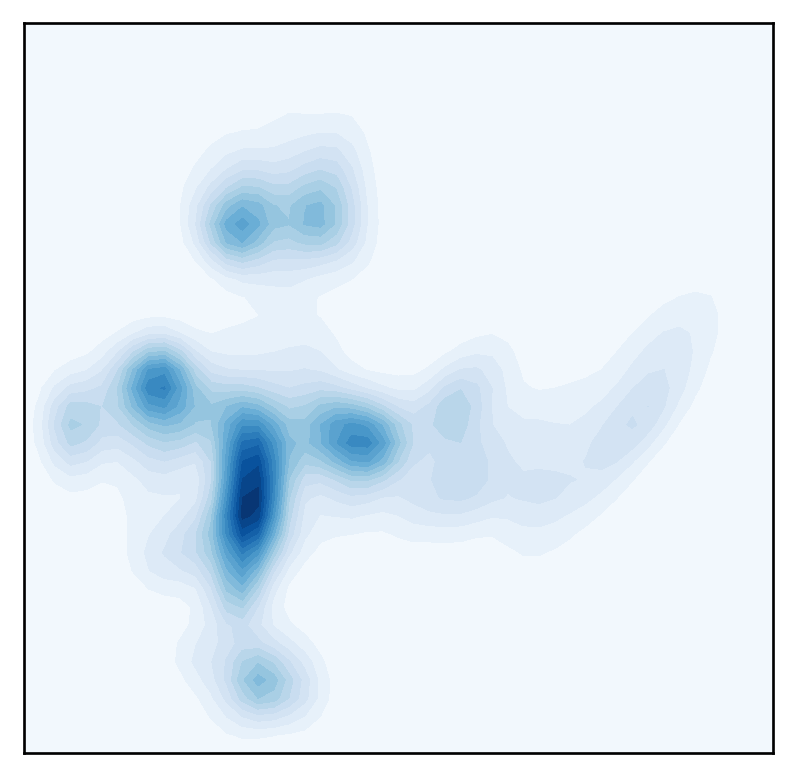

<Figure size 480x480 with 0 Axes>

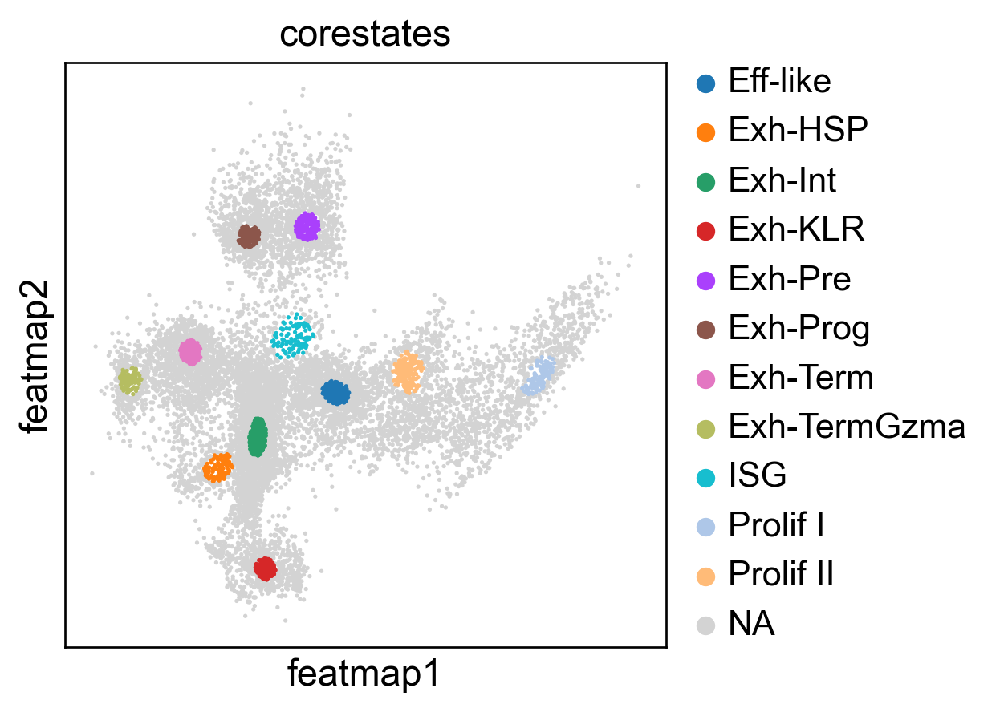

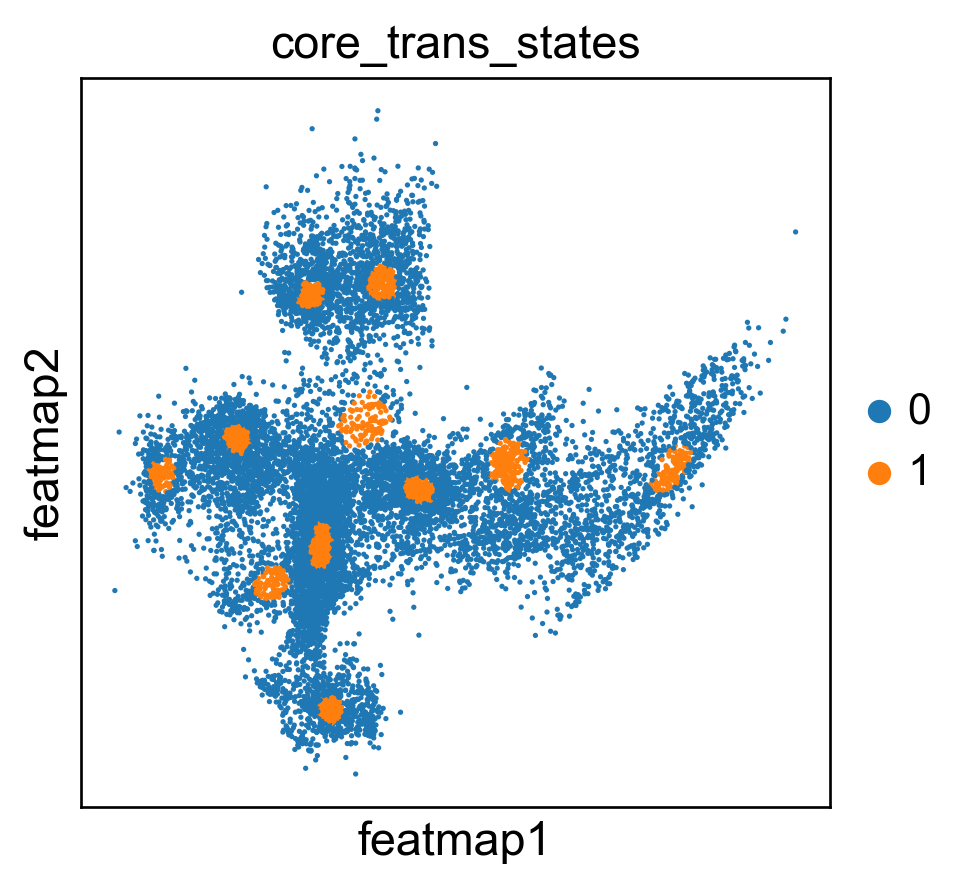

In [74]:
# Contour plot to show the density

from featuremap import core_transition_state
import importlib
importlib.reload(core_transition_state)

# Plot the density 
core_transition_state.plot_density(adata)

# Compute core-states based on clusters
core_transition_state.core_transition_state(adata, top_percent=0.1)

(Optional) Refine the core states by removing core states Exh-HSP and ISG, since they are not in the five density peaks.

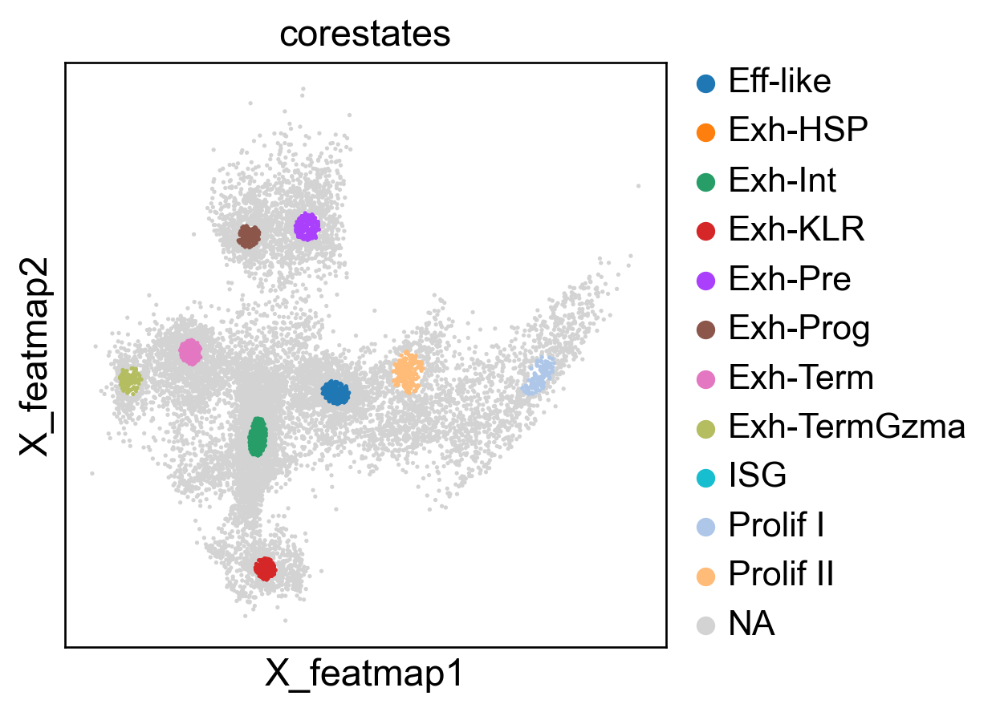

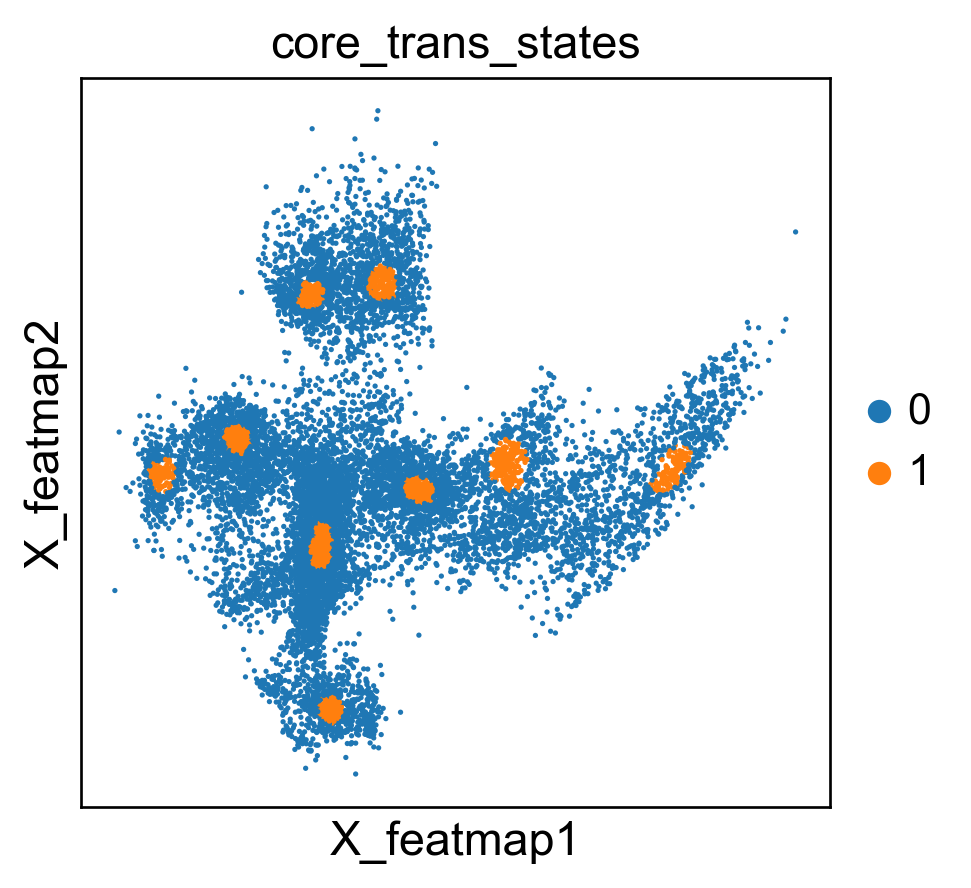

In [75]:
# set core sates '4' and '6' as NaN
adata.obs['corestates'].loc[adata.obs['corestates'] == 'Exh-HSP'] = np.nan
adata.obs['corestates'].loc[adata.obs['corestates'] == 'ISG'] = np.nan

import scanpy as sc
sc.pl.embedding(adata, basis='X_featmap', color='corestates', cmap='viridis', s=10)


# refine the core_trans_states
adata.obs['core_trans_states'] = np.zeros(adata.shape[0]).astype(int).astype(str)
# set all core states to 1
# not nan index 
not_nan_index = adata.obs['corestates'].notna()
not_nan_index = not_nan_index[not_nan_index].index
adata.obs.loc[not_nan_index, 'core_trans_states'] = '1'

# change adata.obs['core_trans_states'] to string



sc.pl.embedding(adata, basis='X_featmap', color='core_trans_states',  s=10)


Project core and transition states to GVA embedding.

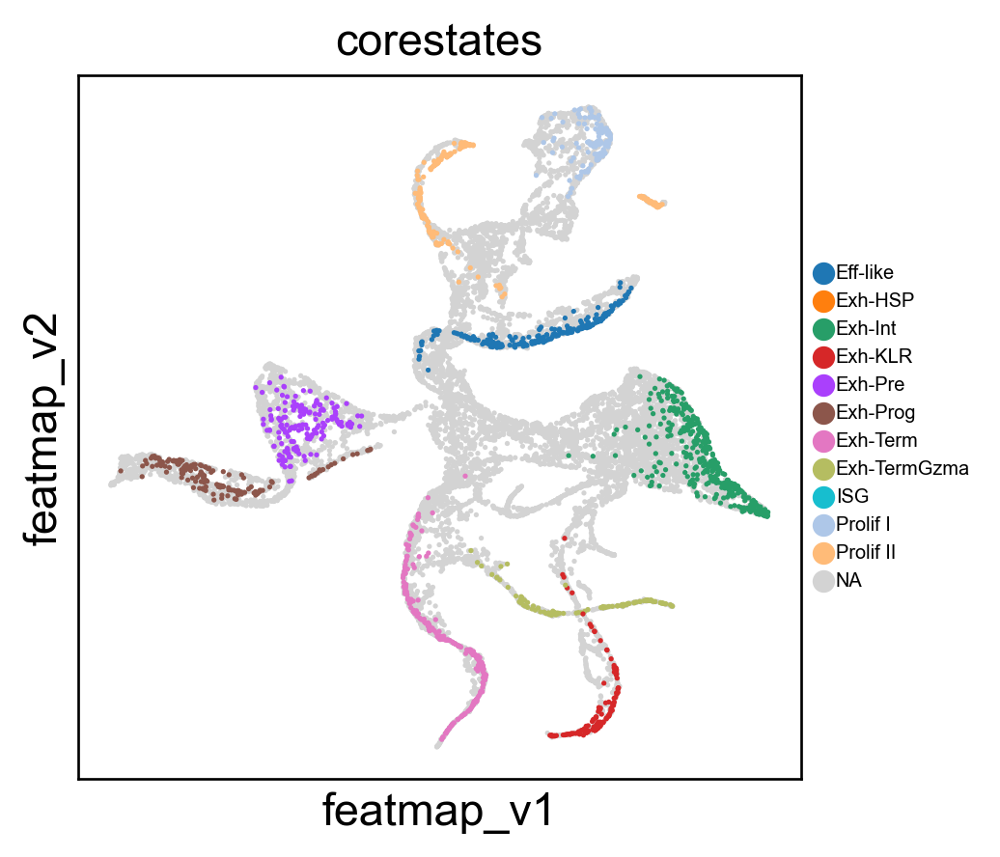

In [76]:
# plot core/transition states on variation embedding
sc.pl.embedding(adata, 'featmap_v',legend_fontsize=6, s=10, color=['corestates'], )

In [14]:
adata

AnnData object with n_obs × n_vars = 11951 × 14577
    obs: 'cellBarcode', 'sampleID', 'ClusterNames', 'ClusterIDs', 'nCount_RNA', 'nFeature_RNA', 'nCount_SCT', 'nFeature_SCT', 'percent.mito', 'clusters', 'time', 'feat_pseudotime', 'density', 'density_separate_cluster', 'corestates', 'corestates_largest', 'corestates_binary', 'corestates_points', 'core_trans_states'
    var: 'features'
    uns: 'clusters_colors', 'corestates_colors', 'core_trans_states_colors'
    obsm: 'X_featmap', '_knn_indices', 'U', 'Singular_value', 'VH', 'vh_smoothed', 'gauge_v1_emb', 'gauge_v2_emb', 'VH_embedding', 'R', 'mu_sum', 're_sum', 're_sum_without_log', 'emb_knn_indices', 'X_embedding', 'X_svd', 'X_featmap_v', 'variation_pc', 'X_featmap_v_3d'
    varm: 'svd_vh'

In [77]:
emb_featuremap_3d = adata.obsm['X_featmap_v_3d']
features.featuremap_var_3d(emb_featuremap_3d, color=adata.obs['core_trans_states'], marker_size=1)

In [135]:
adata

AnnData object with n_obs × n_vars = 24882 × 2000
    obs: 'initial_size', 'percent_mito', 'identifier', 'name', 'louvain', 'batch', 'day', 'clusters_coarse', 'clusters', 'early_vs_late', 'n_genes', 'density', 'density_separate_cluster', 'corestates', 'corestates_largest', 'corestates_binary', 'corestates_points', 'core_trans_states'
    var: 'velocity_gamma', 'velocity_r2', 'velocity_genes', 'highly_variable', 'n_cells', 'means', 'dispersions', 'dispersions_norm'
    uns: 'clusters_colors', 'corestates_colors', 'core_trans_states_colors'
    obsm: 'X_featmap', '_knn_indices', 'U', 'Singular_value', 'VH', 'vh_smoothed', 'gauge_v1_emb', 'gauge_v2_emb', 'VH_embedding', 'R', 'mu_sum', 're_sum', 're_sum_without_log', 'emb_knn_indices', 'X_embedding', 'X_featmap_v', 'variation_pc', 'X_featmap_v_3d'
    varm: 'svd_vh'

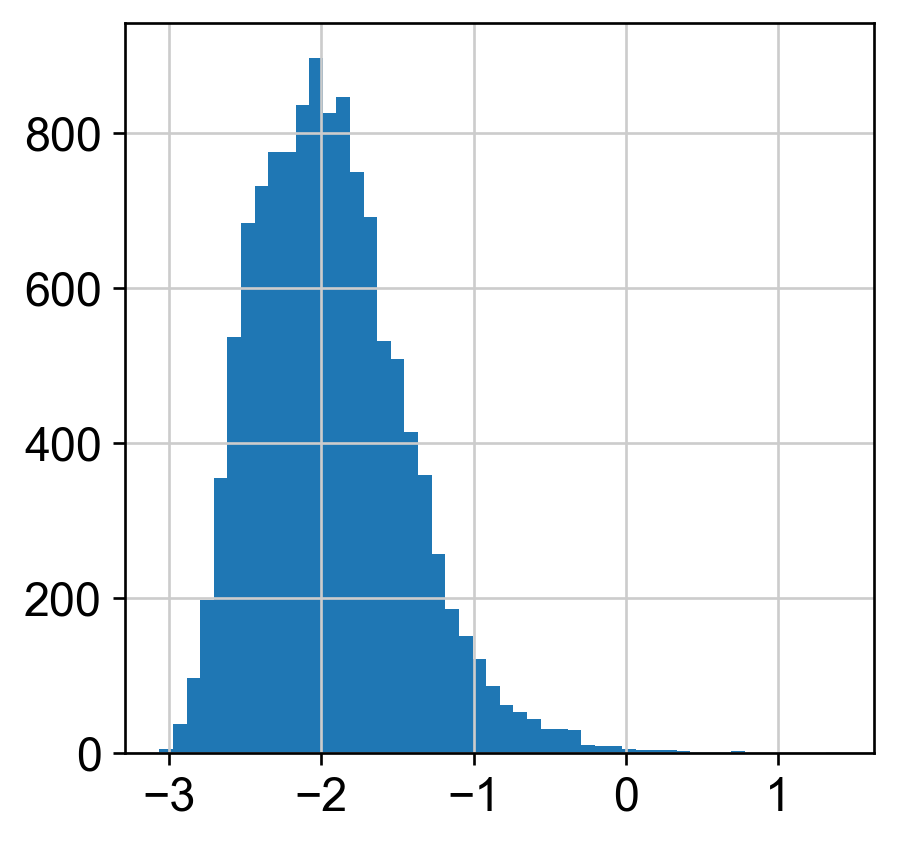

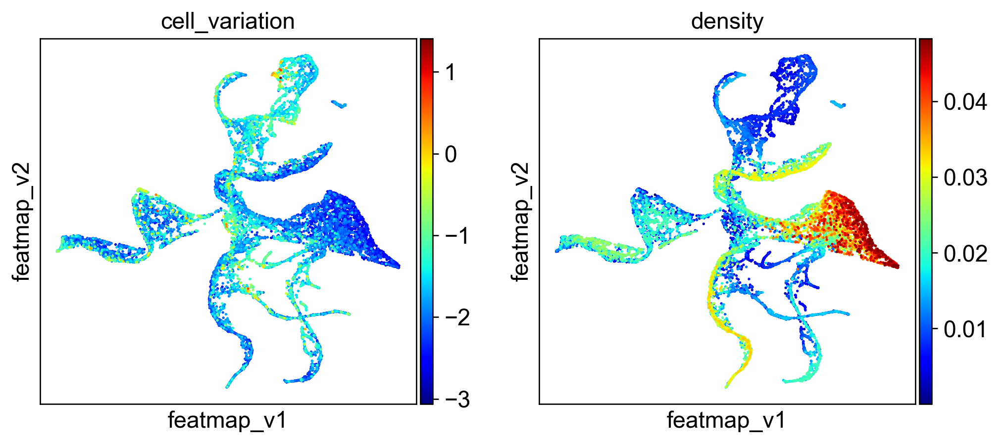

In [66]:
"""
Cell variation
"""
#######################################################
# use singular values to represent the variation
############################################################
# singular_val = emb_featuremap._featuremap_kwds['Singular_value']
# singular_val = emb_featuremap._featuremap_kwds['R']
singular_val = adata.obsm['re_sum_without_log']

# norm of the top k singular values
k=10
singular_val_norm = np.linalg.norm(singular_val[:,:k], axis=1)
singular_val_norm = np.log(singular_val_norm)
# plt.hist(singular_val_norm, bins=50)
import matplotlib.pyplot as plt
plt.hist(singular_val_norm, bins=50)

adata.obs['cell_variation'] = singular_val_norm
sc.pl.embedding(adata, 'featmap_v', legend_loc='on data' , legend_fontsize=10,color=['cell_variation', 'density',], cmap='jet')

  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############           

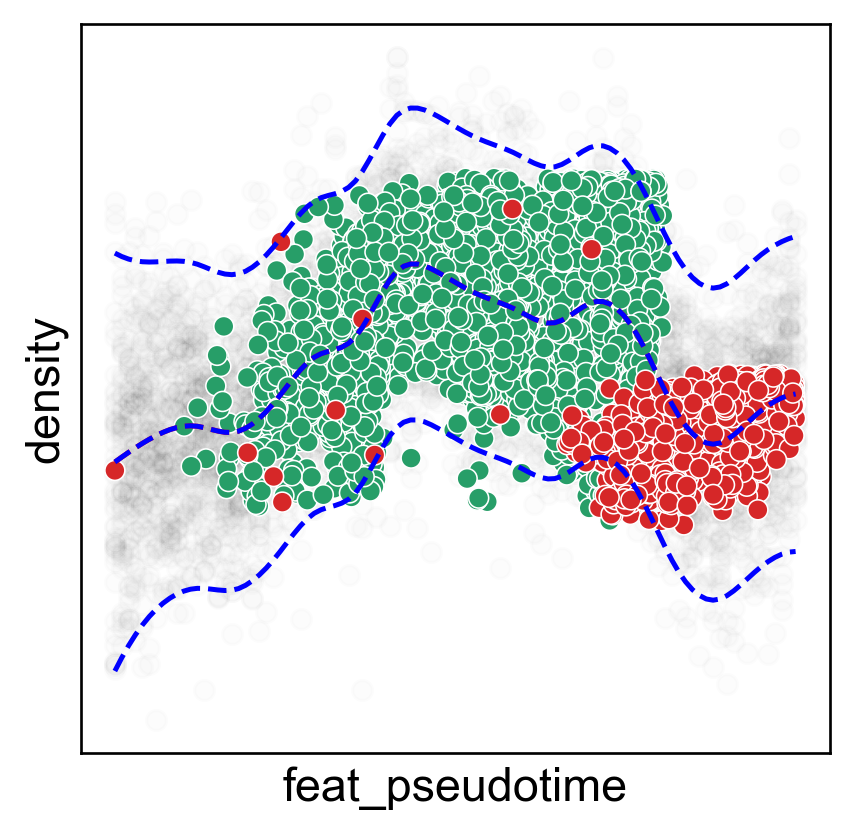

In [32]:
from featuremap.plot import plot_density_pseudotime

# Filter cells based on clusters
selected_clusters = ['Exh-Int', 'Exh-KLR']
filtered_data = adata.obs[adata.obs['clusters'].isin(selected_clusters)]
# downsample the data to 350 cells
# filtered_data = filtered_data.sample(n=350, random_state=42)
# Filter data with density larger than 0.02
# filtered_data = filtered_data[filtered_data['density'] > 0.03]
#%%
# Denstiy vs pseudotime
plot_density_pseudotime(filtered_data, pseudotime='feat_pseudotime', density='density', clusters='clusters')

Leiden clustering on variation to visualize the core and transition states.

In [ ]:
import anndata as ad
adata_var = ad.AnnData(X=adata.obsm['variation_pc'], obs=adata.obs)
adata_var.obsm['X_featmap_v'] = adata.obsm['X_featmap_v']
adata_var.obs['clusters'] = adata.obs['clusters']


In [105]:

# leiiden clustering on variation embedding
sc.pp.pca(adata_var)
sc.pp.neighbors(adata_var, n_neighbors=5,)
sc.tl.leiden(adata_var, resolution=0.3)

adata.obs['leiden_v'] = adata_var.obs['leiden']


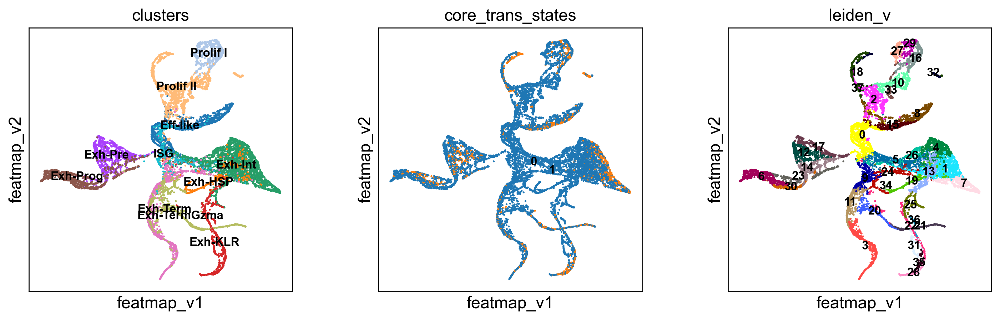

In [107]:
#  plot the density
sc.settings.set_figure_params(dpi=120)
sc.pl.embedding(adata, 'featmap_v',legend_fontsize=10, s=10, legend_loc='on data', 
                color=['clusters','core_trans_states', 'leiden_v'])

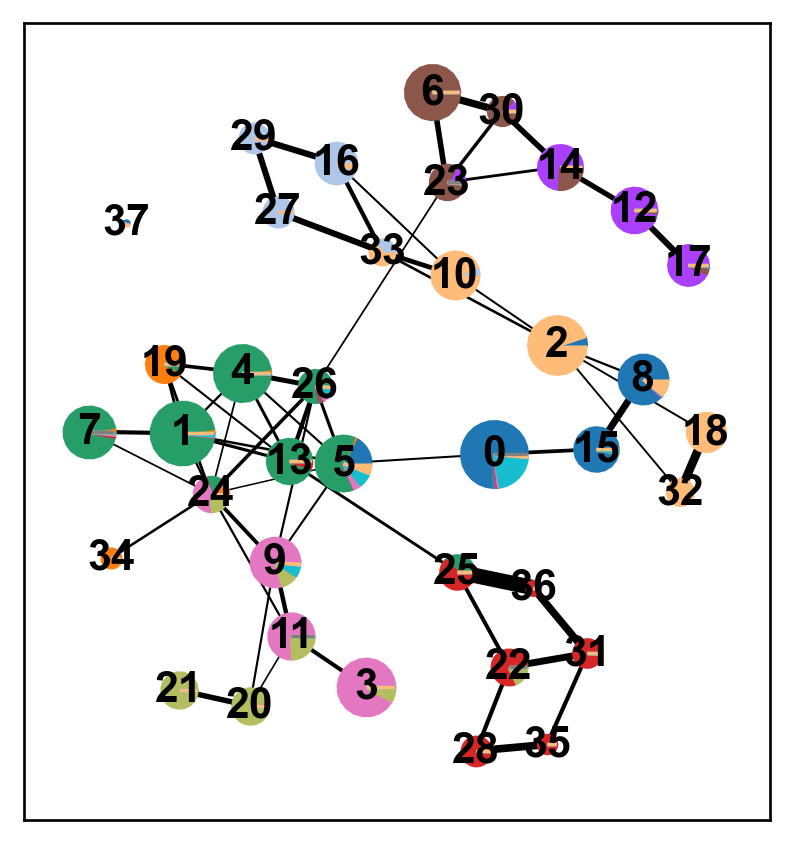

In [110]:
# PAGA
sc.tl.paga(adata_var, groups='leiden')

sc.pl.paga(adata_var, color=['clusters',], threshold=0.06, node_size_scale=1, node_size_power=1)

From the PAGA layout, we can see the path from Exh-Int to Exh-KLR.

In [81]:
import importlib
importlib.reload(features)

# features.featuremap_var_3d(emb_featuremap_3d, color=adata.obs['clusters'], marker_size=3)
features.featuremap_var_3d(emb_featuremap_3d, color=adata.obs['leiden_v'], marker_size=1)

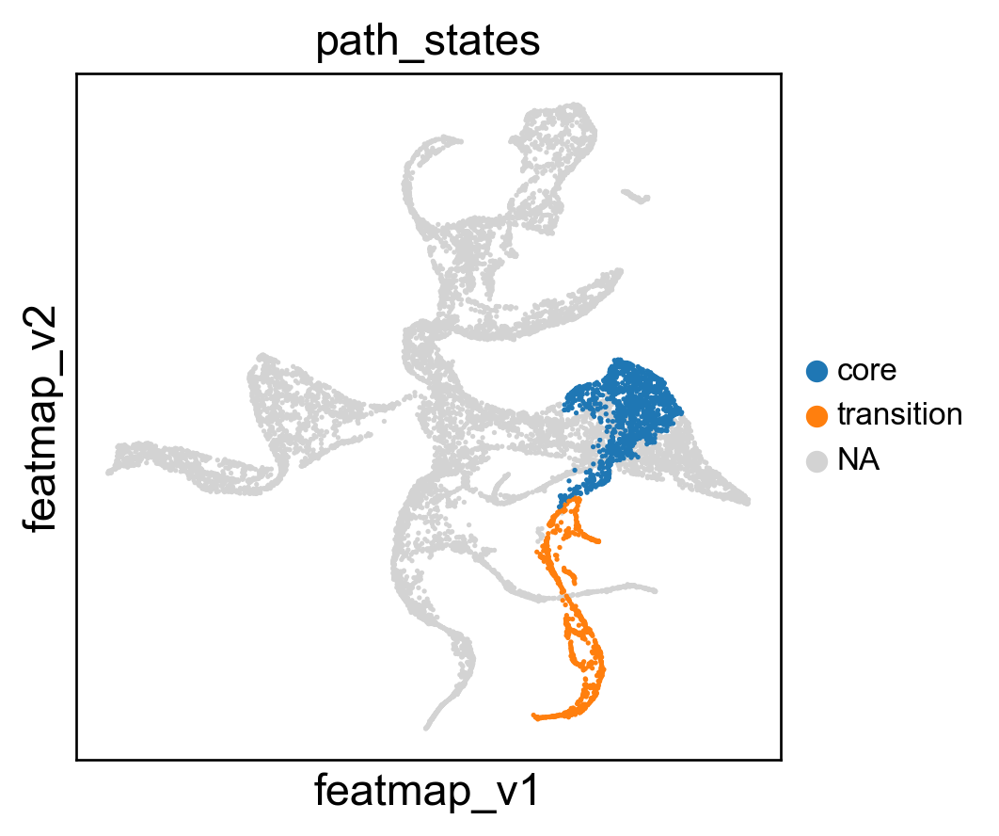

In [95]:

# During the bifurcation, select the core states and transition states by leiiden clustering
core_states = [0,9]
transition_states_1 = [26,23,39,36,25]
# transition_states_2 = [2,11,0]


from featuremap import core_transition_state
import importlib
importlib.reload(core_transition_state)

# core_transition_state.bifurcation_plot(adata, core_states, transition_states_1, transition_states_2)
core_transition_state.path_plot(adata, core_states, transition_states_1)




T-test p-value for core states and transition states_1: 0.0


Text(0.5, 1.0, 'T-test p-value is 0.000e+00')

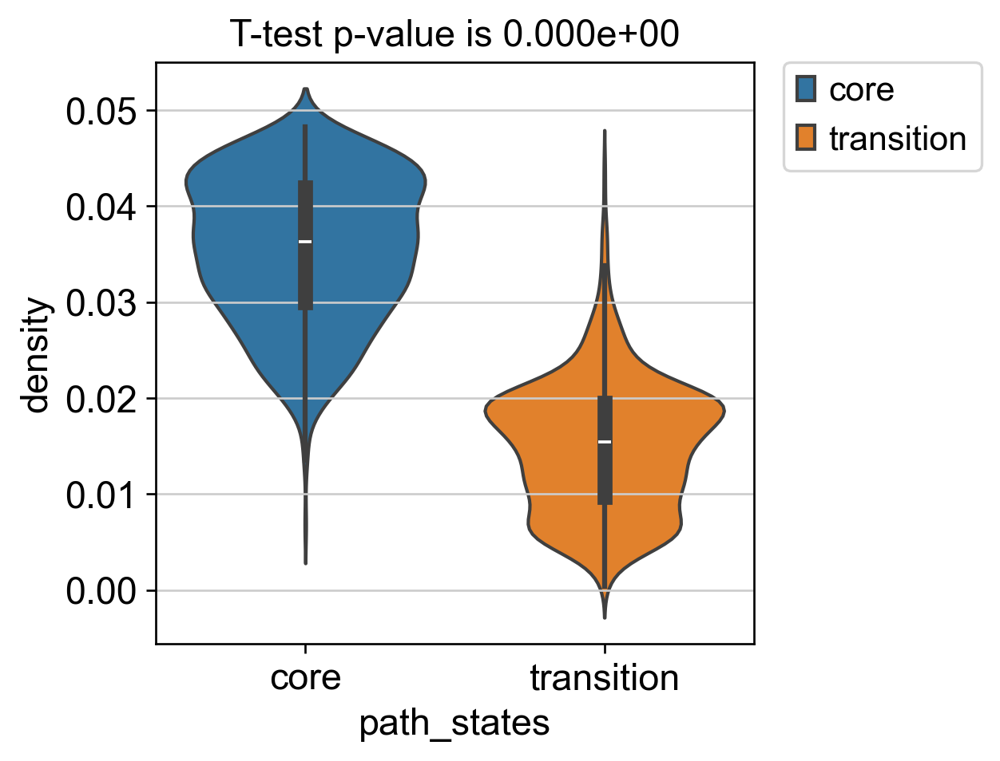

In [83]:
# violin plot to show the density of core states and transition states
from scipy import stats
# t-test for the density of core states and transition states_1
p_val = stats.ttest_ind(adata.obs[adata.obs['path_states']=='core']['density'],
                adata.obs[adata.obs['path_states']=='transition']['density'])[1]
print(f'T-test p-value for core states and transition states_1: {p_val}')

# plot the p_value in the violin plot
import seaborn as sns
import matplotlib.pyplot as plt
sns.violinplot(x ='path_states', y ='density', data = adata.obs, hue='path_states')
# legend outside of the plot
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
# p_value with exponential base 10

plt.title( 'T-test p-value is ' + "{0:.{1}e}".format(p_val, 3))


  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                  

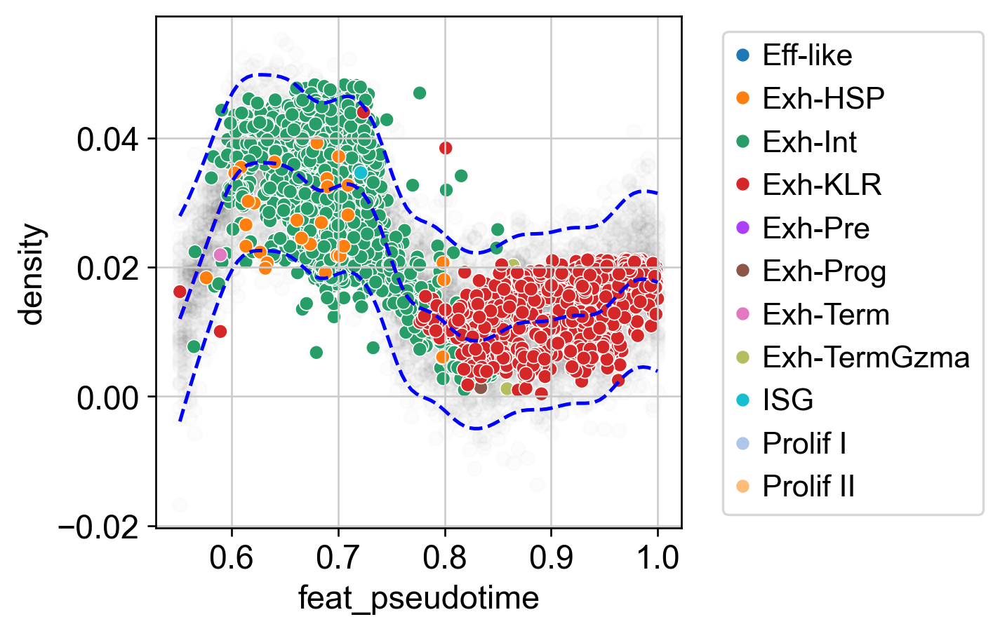

In [103]:
from featuremap import plot
import importlib
importlib.reload(plot)

# Filter cells based on clusters
selected_clusters = [0,9, 26,23,39,36,25]
# list to string
selected_clusters = [str(i) for i in selected_clusters]
filtered_data = adata.obs[adata.obs['leiden_v'].isin(selected_clusters)]
# downsample the data to 350 cells
# filtered_data = filtered_data.sample(n=350, random_state=42)
# Filter data with density larger than 0.02
# filtered_data = filtered_data[filtered_data['density'] > 0.03]
#%%
# Denstiy vs pseudotime
plot.plot_density_pseudotime(filtered_data, pseudotime='feat_pseudotime', density='density', clusters='clusters')

Differential Gene Variation Analysis

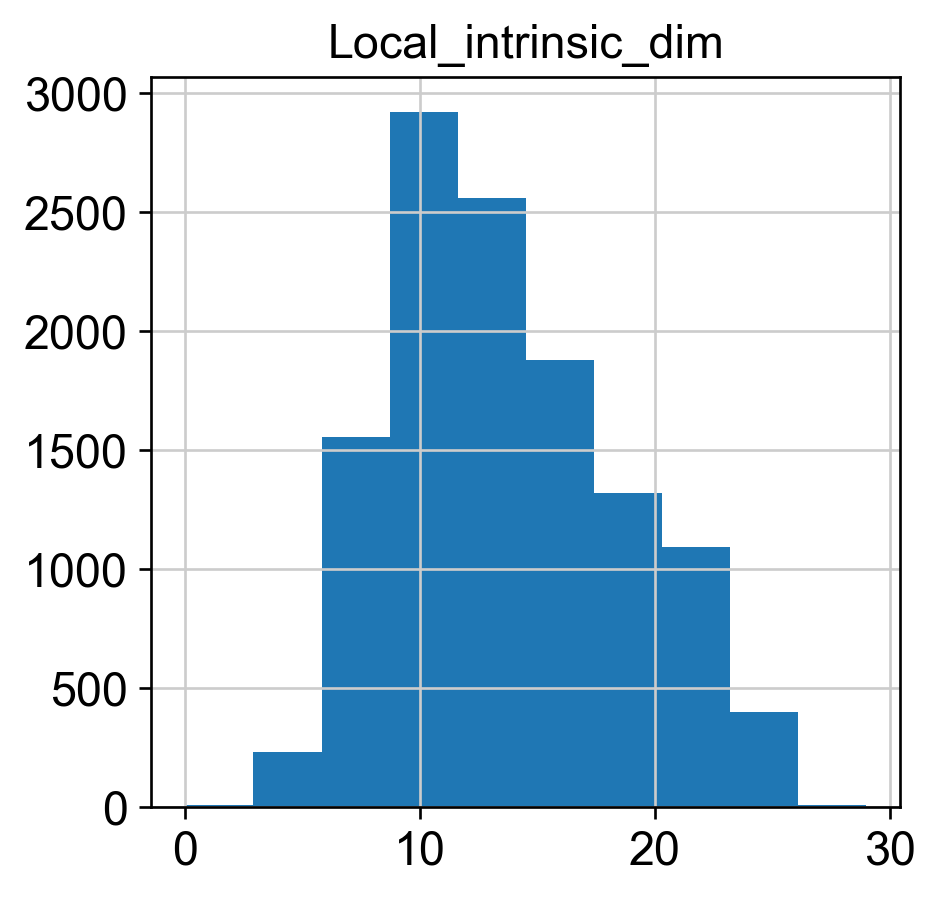

k is 13
Start matrix multiplication
Finish matrix multiplication in 192.34522008895874
Finish norm calculation in 170.3265039920807


<Figure size 480x480 with 0 Axes>

In [96]:
importlib.reload(featuremap_)
from featuremap.features import feature_variation, variation_feature_pp

# Get the variation of each feature
feature_variation(adata, threshold=0.9)

# Preprocess the feature variation 
adata_var = variation_feature_pp(adata)

adata.layers['variation_feature_processed'] = adata_var.layers['var_filter'].copy()


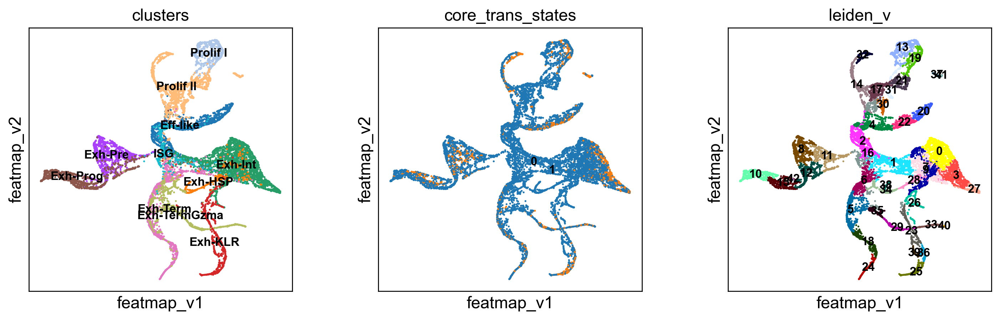

In [97]:
sc.pl.embedding(adata, 'featmap_v',legend_fontsize=10, s=10, legend_loc='on data', 
                color=['clusters','core_trans_states', 'leiden_v'])

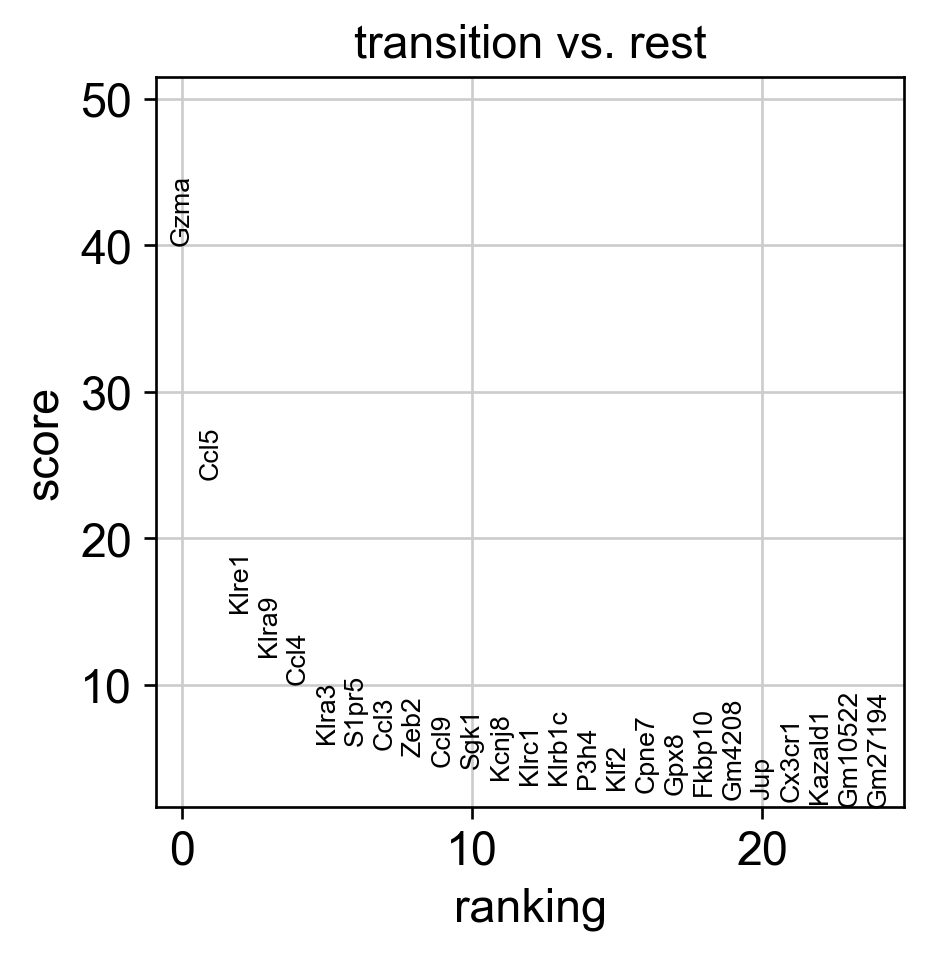

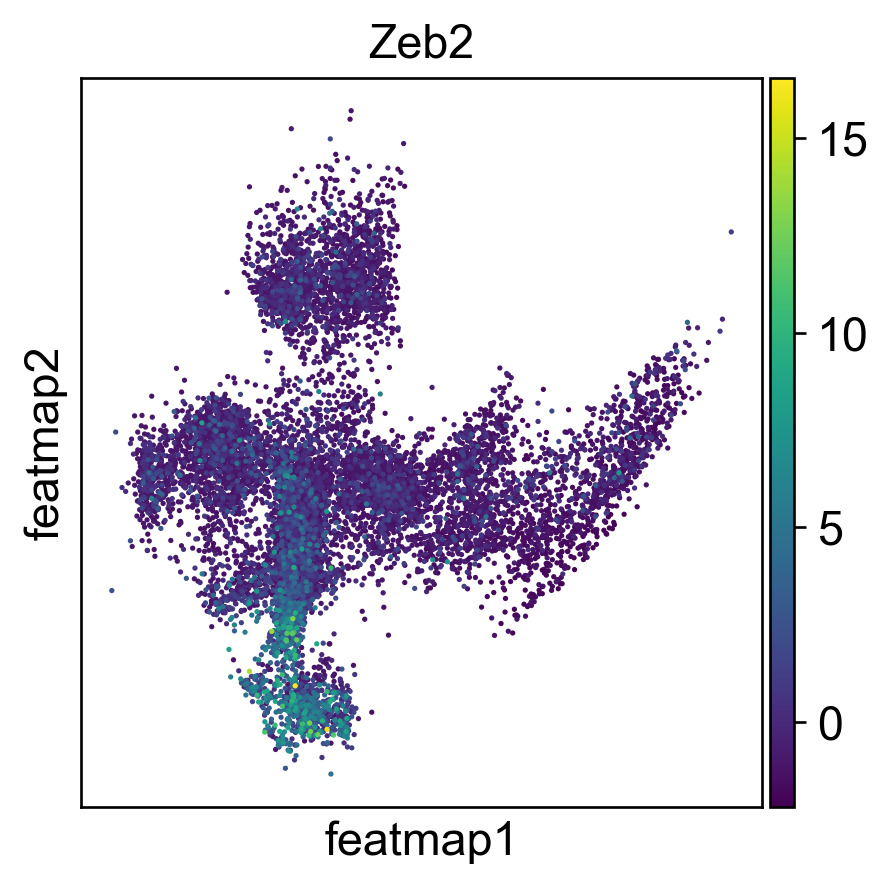

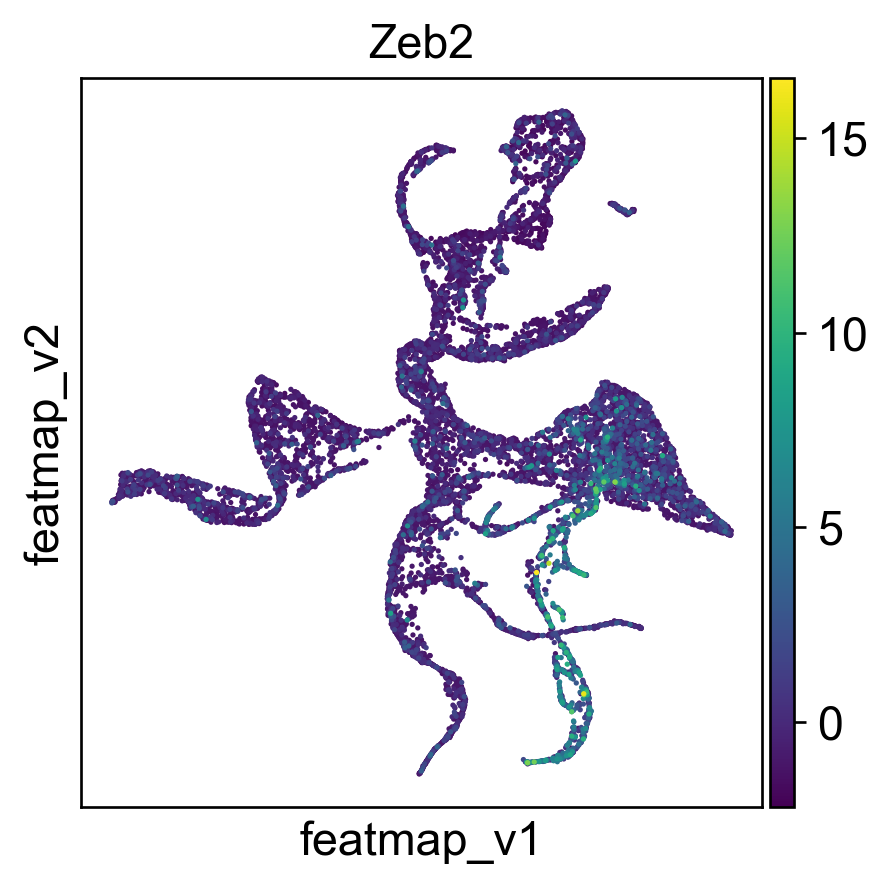

Rank of Zeb2 is  [8] in transition
Start matrix multiplication
Finish matrix multiplication in 0.17419981956481934


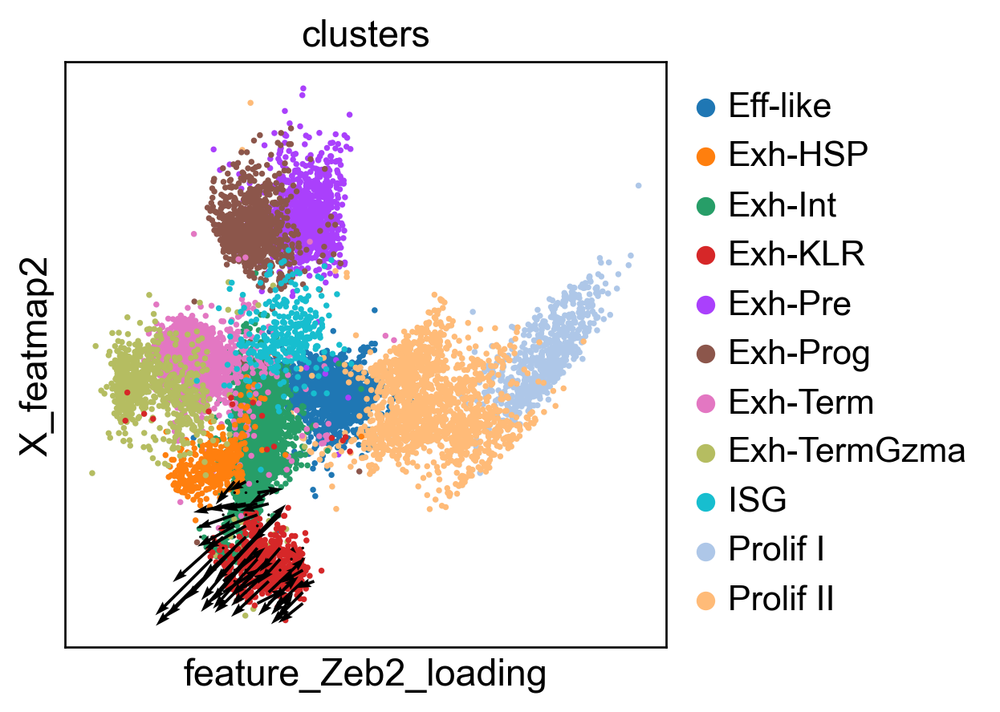

<Figure size 480x480 with 0 Axes>

In [98]:
import importlib
importlib.reload(features)

sc.tl.rank_genes_groups(adata_var, 'path_states', groups=['transition'],  method='wilcoxon', use_raw=False, layer='var_filter')
sc.pl.rank_genes_groups(adata_var, n_genes=25, sharey=False)
# Top 5 genes in rank_genes_groups
top_genes = adata_var.uns['rank_genes_groups']['names']['transition'][:5]


gene = 'Zeb2'
sc.pl.embedding(adata, 'featmap' ,color=[gene],)
sc.pl.embedding(adata, 'featmap_v' ,color=[gene],)
rank = np.where(adata_var.uns['rank_genes_groups']['names']['transition'] == gene)[0]
print(f'Rank of {gene} is  {rank} in transition')

features.feature_projection(adata, feature=gene)
features.plot_one_feature(adata, feature=gene, ratio=0.1, density=1, embedding='X_featmap',
                               pseudotime='feat_pseudotime', pseudotime_adjusted=True, 
                               plot_within_cluster=['Exh-Int', 'Exh-KLR'],
                               )    


Start matrix multiplication
Finish matrix multiplication in 0.08104085922241211


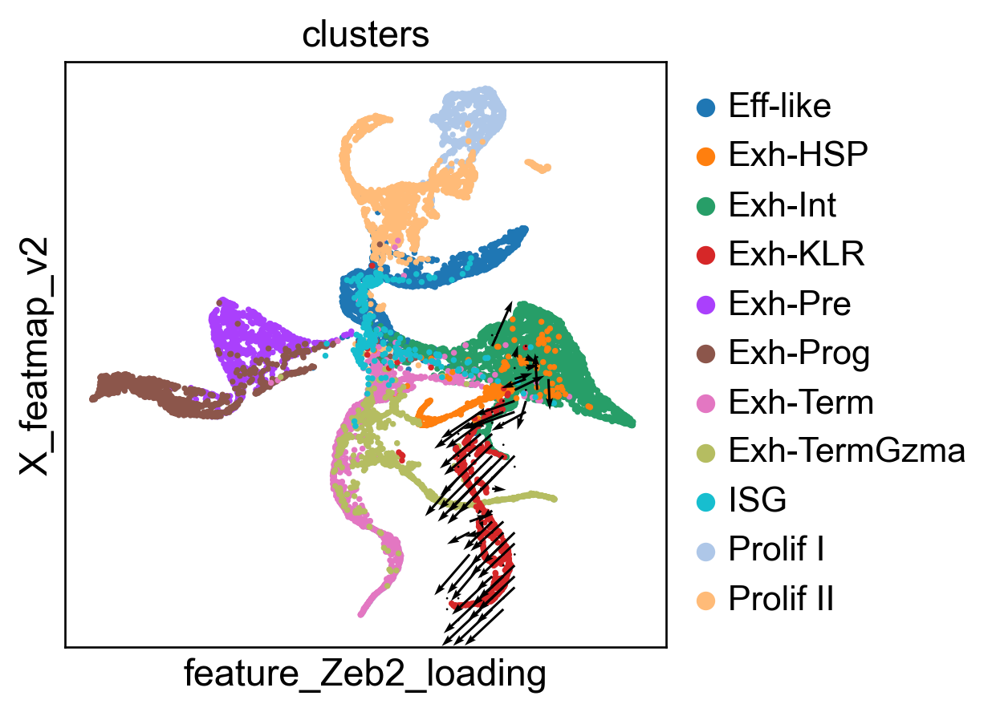

<Figure size 480x480 with 0 Axes>

In [99]:
features.feature_projection(adata, feature=gene)
features.plot_one_feature(adata, feature=gene, ratio=0.1, density=1, embedding='X_featmap_v',
                               pseudotime='feat_pseudotime', pseudotime_adjusted=True, 
                               plot_within_cluster=['Exh-Int', 'Exh-KLR'],
                               )    
